This code is originated from [jina-ai's blog post](https://jina.ai/news/scaling-test-time-compute-for-embedding-models/)

# jina-clip-v1 Tutorial

Jina CLIP is an OpenAI CLIP-like model, but [it is trained in a special way that enables text-to-text, text-to-image, image-to-text, and image-to-image retrieval](https://arxiv.org/abs/2405.20204). Note that the original CLIP model is only trained with text-to-image relationships, so it is not suitable for text retrieval. (While it is possible to use it for text retrieval, the performance would be significantly worse compared to even trivial dense retrievers.) Additionally, Jina CLIP extends the context length of the text tower to 8K, the same as [`jina-embeddings-v2-base-en`](https://huggingface.co/jinaai/jina-embeddings-v2-base-en), allowing for long text retrieval.

**In short: one model, two modalities, four retrieval directions.**


In this tutorial, we want to demonstrate Jina CLIP on a [simple text-image Pokémon card dataset](https://huggingface.co/datasets/TheFusion21/PokemonCards), with a focus on how to use the model in practice.

In [ ]:
!pip install -U transformers datasets timm einops

In [ ]:
from transformers import AutoModel
model = AutoModel.from_pretrained('jinaai/jina-clip-v2', trust_remote_code=True)

/root/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:140: UserWarning: Flash attention is not installed. Check https://github.com/Dao-AILab/flash-attention?tab=readme-ov-file#installation-and-features for installation instructions, disabling
  warnings.warn(
/root/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:175: UserWarning: xFormers is not installed. Check https://github.com/facebookresearch/xformers?tab=readme-ov-file#installing-xformers for installation instructions, disabling
  warnings.warn(


OK let's load the dataset and take first 100 data points.

In [ ]:
from datasets import load_dataset
from PIL import Image
from io import BytesIO
import requests

# Load dataset
dataset = load_dataset("TheFusion21/PokemonCards", split='train')


N=20
subset = dataset.select(range(N))
image_urls = [item['image_url'] for item in subset]

# Downdload images from URLs into PIL Image objects
images = [Image.open(BytesIO(requests.get(url).content)) for url in image_urls]
texts = [item['caption'] for item in subset]
names = [item['name'] for item in subset]

In [ ]:
names

['Absol G',
 'Aerodactyl',
 'Weedle',
 'Caterpie',
 'Azumarill',
 'Bulbasaur',
 'Venusaur',
 'Absol',
 'Aggron',
 'Beedrill δ',
 'Alakazam',
 'Ampharos',
 'Dratini',
 'Ampharos',
 'Ampharos',
 'Arcanine',
 "Blaine's Moltres",
 'Aerodactyl',
 'Celebi & Venusaur-GX',
 'Caterpie']

In [ ]:
# Function to collect test set
def create_test_set(dataset, N):
    # Dictionary to store test set items
    test_names = []
    test_images = []

    # Iterate through unique names
    for name in set(names):
        # Find indices of all items with this name
        name_indices = [i for i, item_name in enumerate(dataset['name']) if item_name == name]

        # Skip if not enough instances after the first N items
        subset_indices = [idx for idx in name_indices if idx >= N]

        print(f'find {len(subset_indices)} for {name}')
        if subset_indices:
            # Take up to 10 instances
            selected_indices = subset_indices[:10]

            for idx in selected_indices:
                # Download image
                try:
                    image_url = dataset[idx]['image_url']
                    response = requests.get(image_url)
                    image = Image.open(BytesIO(response.content))

                    test_names.append(dataset[idx]['name'])
                    test_images.append(image)
                except Exception as e:
                    print(f"Error processing image for {dataset[idx]['name']}: {e}")

    return test_names, test_images

# Create test set
test_names, test_images = create_test_set(dataset, N)

find 16 for Caterpie
find 0 for Beedrill δ
find 22 for Weedle
find 3 for Celebi & Venusaur-GX
find 15 for Venusaur
find 17 for Ampharos
find 0 for Absol G
find 8 for Aerodactyl
find 14 for Absol
find 0 for Blaine's Moltres
find 7 for Alakazam
find 23 for Dratini
find 14 for Azumarill
find 24 for Arcanine
find 11 for Aggron
find 19 for Bulbasaur


Let's look at the text and image in the dataset.

In [ ]:
test_names

['Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Caterpie',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Weedle',
 'Celebi & Venusaur-GX',
 'Celebi & Venusaur-GX',
 'Celebi & Venusaur-GX',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Venusaur',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Ampharos',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Aerodactyl',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Absol',
 'Alakazam',
 'Alakazam',
 'Alakazam',
 'Alakazam',
 'Alakazam',
 'Alakazam',
 'Alakazam',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Dratini',
 'Drat

In [ ]:
texts = [f'this is a pokemon card of {n}' for n in names]

In [ ]:
from PIL import Image
import numpy as np

def crop_pokemon_art(image):
    """
    Crops the upper graphical part of a Pokemon card image.

    Parameters:
    image (PIL.Image): Input Pokemon card image

    Returns:
    PIL.Image: Cropped image containing only the artwork portion
    """
    # Convert to RGB if image is in RGBA
    if image.mode == 'RGBA':
        image = image.convert('RGB')

    # Get image dimensions
    width, height = image.size

    # The artwork typically occupies the upper ~40% of the card
    # Adjust these values based on your specific needs
    crop_height = int(height * 0.4)

    # Add a small margin from the top to avoid the name/HP area
    top_margin = int(height * 0.1)

    # Crop the image
    cropped_image = image.crop((
        0,                  # Left
        top_margin,        # Top
        width,            # Right
        crop_height       # Bottom
    ))

    return cropped_image

def process_pokemon_cards(images):
    """
    Process a list of Pokemon card images and return their cropped versions.

    Parameters:
    images (list): List of PIL Image objects

    Returns:
    list: List of cropped PIL Image objects
    """
    cropped_images = []

    for img in images:
        try:
            cropped = crop_pokemon_art(img)
            cropped_images.append(cropped)
        except Exception as e:
            print(f"Error processing image: {e}")
            # Append None or the original image if cropping fails
            cropped_images.append(None)

    return cropped_images

In [ ]:
cropped_images = process_pokemon_cards(images)
cropped_test_images = process_pokemon_cards(test_images)


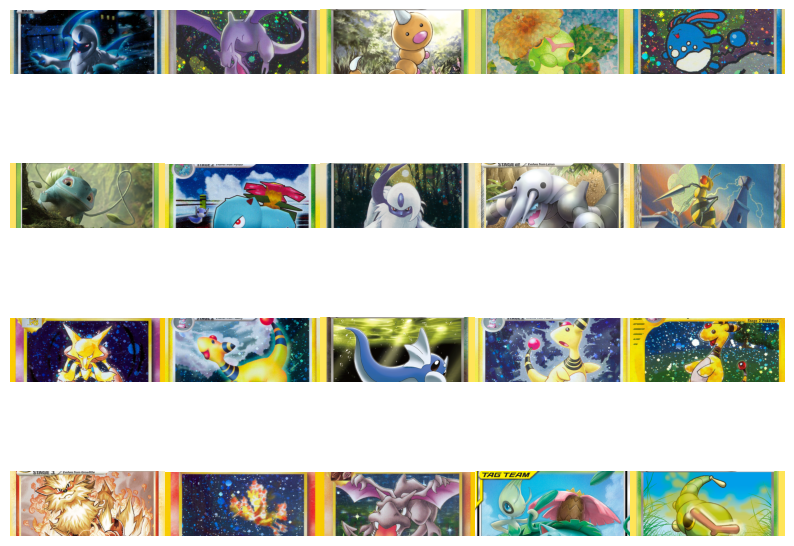

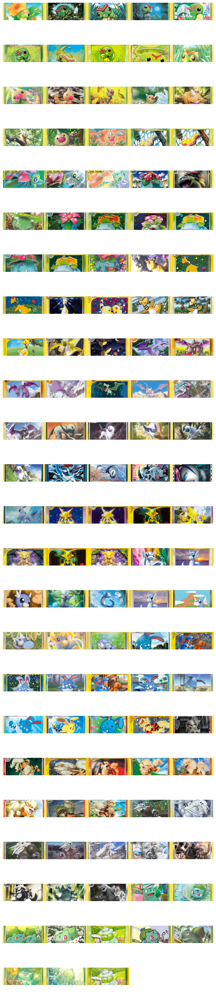

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_images_grid(images, cols=5):
    """
    Plots a list of PIL images in a grid while preserving their original aspect ratios.

    Parameters:
    - images: List of PIL images to be plotted.
    - cols: Number of columns in the grid. Rows are determined automatically.

    Returns:
    None
    """
    # Calculate the number of rows needed
    rows = int(np.ceil(len(images) / cols))

    # Create a figure with appropriate size
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2), squeeze=False)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    for ax, img in zip(axes, images):
        # Turn off the axis
        ax.axis('off')
        # Plot the image
        ax.imshow(img)

    # Turn off remaining empty axes
    for ax in axes[len(images):]:
        ax.axis('off')

    # Adjust layout to remove gaps
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Example usage
plot_images_grid(cropped_images)


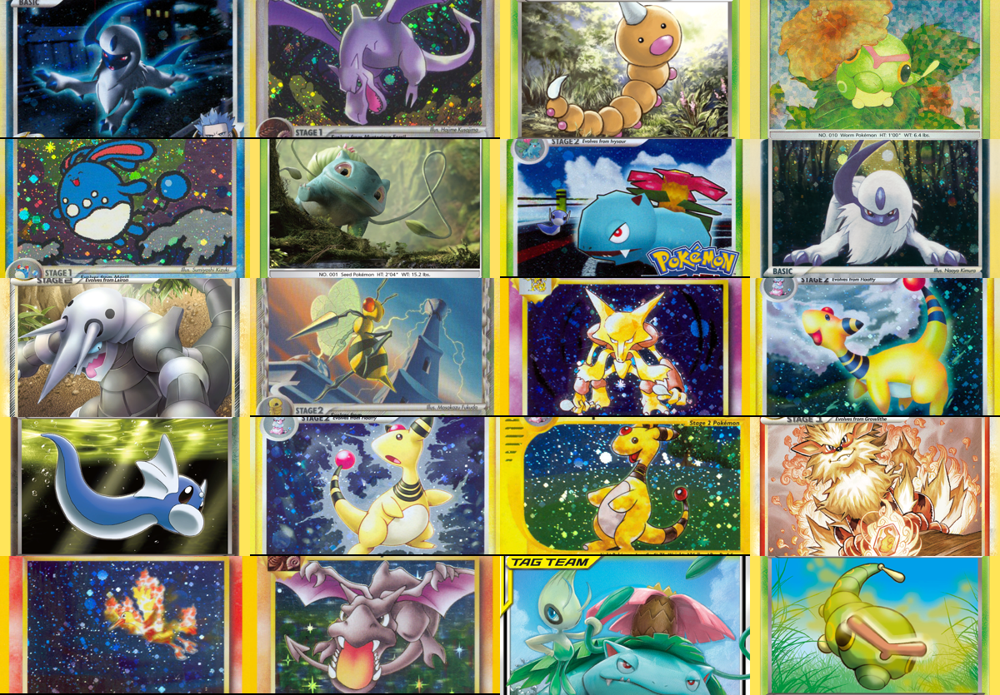

In [ ]:
cropped_images[1]

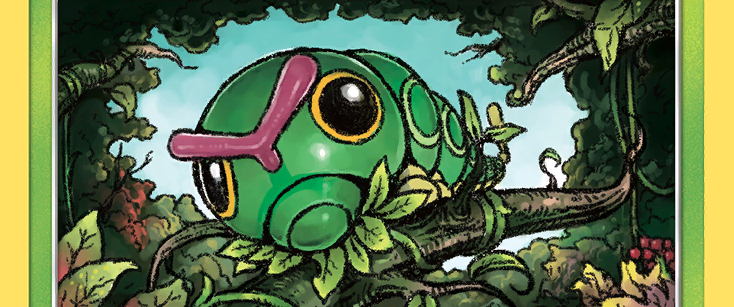

In [ ]:
cropped_test_images[1]

The text is quite long (definitely not just a simple keyword salad and longer than what the original CLIP allowed) and the images are complex, featuring graphics, structures, and in-image text.

Let's embed them!

In [ ]:
# dont forget to move model to GPU if u have one
model.to('cuda')

In [ ]:
# sort and unique names
_names = sorted(list(set(names)))
_test_names = sorted(list(set(test_names)))
text_embeddings = model.encode_text(_names)
test_text_embeddings = model.encode_text(_test_names)

In [ ]:
# use the index of name from names in _names as the groundtruth
groundtruth = [_names.index(n) for n in names]
test_groundtruth = [_test_names.index(n) for n in test_names]

In [ ]:
test_image_embeddings = model.encode_image(cropped_test_images)
image_embeddings = model.encode_image(cropped_images)

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def validate_embeddings(image_embeddings, text_embeddings, groundtruth):
    """
    Validates matching between image and text embeddings using cosine similarity.

    Parameters:
    image_embeddings (np.ndarray): Array of image embeddings with shape (n_samples, n_features)
    text_embeddings (np.ndarray): Array of text embeddings with shape (n_samples, n_features)

    Returns:
    float: Accuracy rate
    list: List of correct/incorrect predictions for each sample
    dict: Detailed results including similarity matrices and predicted matches
    """
    # Calculate cosine similarity between all pairs
    similarity_matrix = cosine_similarity(image_embeddings, text_embeddings)

    # Get the index of maximum similarity for each image embedding
    predicted_matches = [_names[idx] for idx in np.argmax(similarity_matrix, axis=1)]
    assert len(predicted_matches) == len(groundtruth)

    # Calculate accuracy
    correct_matches = [pred == gt for pred, gt in zip(predicted_matches, groundtruth)]
    accuracy = np.mean(correct_matches)

    # Prepare detailed results
    results = {
        'similarity_matrix': similarity_matrix,
        'predicted_matches': predicted_matches,
        'correct_predictions': correct_matches,
        'accuracy': accuracy
    }

    # Print results
    print(f"Overall accuracy: {accuracy * 100:.2f}%")
    print("\nDetailed matching results:")
    for i, (pred, correct) in enumerate(zip(predicted_matches, correct_matches)):
        status = "✓" if correct else "✗"
        print(f"Sample {i}: Predicted match: {pred}, Correct: {status}")
        if not correct:
            print(f"  Similarity scores: {similarity_matrix[i]}")

    return accuracy, correct_matches, results

In [ ]:
accuracy, matches, details = validate_embeddings(image_embeddings, text_embeddings, groundtruth)


Overall accuracy: 0.00%

Detailed matching results:
Sample 0: Predicted match: Bulbasaur, Correct: ✗
  Similarity scores: [0.179269   0.21155691 0.1754398  0.1806635  0.18755424 0.18278305
 0.21028987 0.19596444 0.18762912 0.18673089 0.24635726 0.21285161
 0.24614641 0.16489255 0.17284054 0.19251245]
Sample 1: Predicted match: Bulbasaur, Correct: ✗
  Similarity scores: [0.23167565 0.24492957 0.22839728 0.21629077 0.20907496 0.1790771
 0.21709813 0.23736137 0.22620416 0.17160547 0.28018808 0.24193884
 0.2698357  0.20616002 0.22870553 0.22035092]
Sample 2: Predicted match: Bulbasaur, Correct: ✗
  Similarity scores: [0.19963226 0.17605522 0.19393618 0.19910865 0.18469718 0.16607457
 0.19392636 0.23501047 0.20148668 0.15948814 0.2558157  0.25065565
 0.21214959 0.18035622 0.20560925 0.24943772]
Sample 3: Predicted match: Weedle, Correct: ✗
  Similarity scores: [0.16143104 0.15445903 0.13979176 0.15279773 0.1652118  0.13975543
 0.1448696  0.1837947  0.16111568 0.15037718 0.21743481 0.1928769

In [ ]:
len(set(test_groundtruth))

13

In [ ]:
accuracy, matches, details = validate_embeddings(test_image_embeddings, test_text_embeddings, test_groundtruth)


Overall accuracy: 0.00%

Detailed matching results:
Sample 0: Predicted match: Celebi & Venusaur-GX, Correct: ✗
  Similarity scores: [0.16188264 0.13901292 0.15625483 0.16686547 0.14701024 0.1544296
 0.19156817 0.2088357  0.19855398 0.19033138 0.14875478 0.14734414
 0.21758811]
Sample 1: Predicted match: Celebi & Venusaur-GX, Correct: ✗
  Similarity scores: [0.18744873 0.21444464 0.1801994  0.16972578 0.15858012 0.1569448
 0.19839448 0.21810247 0.25273302 0.21039034 0.15532143 0.17665674
 0.25457364]
Sample 2: Predicted match: Blaine's Moltres, Correct: ✗
  Similarity scores: [0.16923226 0.19054092 0.15804651 0.16697653 0.15967761 0.15597232
 0.19580789 0.22622295 0.22611992 0.23592791 0.16068912 0.18760873
 0.22576487]
Sample 3: Predicted match: Beedrill δ, Correct: ✗
  Similarity scores: [0.1657656  0.18750054 0.16485314 0.15922761 0.17110229 0.14618471
 0.18528496 0.21686864 0.24051586 0.22492935 0.14280301 0.18809947
 0.21499367]
Sample 4: Predicted match: Beedrill δ, Correct: ✗
  

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

def batch_classify_pokemon(model, classification_groups, image_embeddings, ground_truth_labels=None):
    """
    Classification with probability-based scoring and tie-breaking.
    """
    # Create all text prompts and track mappings
    all_prompts = []
    group_slices = {}
    current_idx = 0

    for group_name, group_info in classification_groups.items():
        options = group_info["options"]
        group_prompts = [group_info["prompt"].format(opt) for opt in options]
        all_prompts.extend(group_prompts)

        group_slices[group_name] = slice(current_idx, current_idx + len(options))
        current_idx += len(options)

    # Compute text embeddings and similarity
    text_embeddings = model.encode_text(all_prompts)
    similarities = cosine_similarity(image_embeddings, text_embeddings)

    results = []
    for img_idx, img_similarities in enumerate(similarities):
        # Convert each group's similarity scores into probabilities
        group_probabilities = {}
        predictions = {}

        for group_name, group_slice in group_slices.items():
            group_sims = img_similarities[group_slice]
            probs = softmax(group_sims)
            pred_idx = np.argmax(group_sims)
            predictions[group_name] = pred_idx
            group_probabilities[group_name] = probs

        # Calculate a probability-based score for each Pokémon
        pokemon_scores = {}
        for pokemon_name, rules in pokemon_system["pokemon_rules"].items():
            # Sum the probabilities of the correctly matched attribute options
            score = 0.0
            for group_name, target_idx in rules.items():
                # We consider the probability assigned to the predicted option for that group
                # If the predicted option matches the target_idx, we add its probability
                pred_idx = predictions[group_name]
                if pred_idx == target_idx:
                    # Add the probability of that option
                    prob = group_probabilities[group_name][pred_idx]
                    score += prob
            pokemon_scores[pokemon_name] = score

        # Pick the Pokémon with the highest score
        # If two Pokémon tie with the same probability sum, max() will choose the first one it encounters.
        # This is still better than simple majority since we are now using continuous probabilities.
        best_pokemon = max(pokemon_scores.items(), key=lambda x: x[1])

        results.append({
            "predicted": best_pokemon[0],
            "score": best_pokemon[1],
            "total_possible": len(predictions),
            "predictions": predictions,
            "all_scores": pokemon_scores
        })

    # Calculate accuracy if ground truth is provided
    if ground_truth_labels:
        correct = sum(1 for res, true in zip(results, ground_truth_labels)
                      if res["predicted"] == true)
        accuracy = correct / len(ground_truth_labels)
        print(f"\nOverall accuracy: {accuracy:.2%}")

        # Print detailed results
        print("\nDetailed Results:")
        for idx, (result, true_label) in enumerate(zip(results, ground_truth_labels)):
            print(f"\nImage {idx} ({true_label}):")
            print(f"Predicted: {result['predicted']} with score {result['score']:.4f}")
            print("Scores per Pokemon:", result['all_scores'])
            print("Group predictions:")
            for group, pred_idx in result['predictions'].items():
                print(f"  {group}: option {pred_idx}")

    return results


In [ ]:
pokemon_system = {
    "classification_groups": {
        "dominant_color": {
            "prompt": "This Pokémon’s body is mainly {} in color.",
            "options": [
                "white",    # Absol, Absol G
                "gray",     # Aggron
                "brown",    # Aerodactyl, Weedle, Beedrill δ
                "blue",     # Azumarill
                "green",    # Bulbasaur, Venusaur, Celebi&Venu, Caterpie
                "yellow",   # Alakazam, Ampharos
                "red",      # Blaine's Moltres
                "orange",   # Arcanine
                "light blue"# Dratini
            ]
        },
        "primary_form": {
            "prompt": "It looks like {}.",
            "options": [
                "a wolf",         # Absol, Absol G
                "an armored dinosaur",  # Aggron
                "a winged reptile",     # Aerodactyl
                "a rabbit-like creature", # Azumarill
                "a toad-like creature",   # Bulbasaur, Venusaur, Celebi&Venu
                "a caterpillar larva",    # Weedle, Caterpie
                "a wasp-like insect",     # Beedrill δ
                "a fox-like humanoid",     # Alakazam
                "a sheep-like biped",      # Ampharos
                "a dog-like beast",        # Arcanine
                "a flaming bird",          # Blaine’s Moltres
                "a serpentine dragon"      # Dratini
            ]
        },
        "key_trait": {
            "prompt": "Its most notable feature is {}.",
            "options": [
                "a single white horn", # Absol, Absol G
                "metal armor plates",  # Aggron
                "large wings",         # Aerodactyl, Beedrill δ
                "rabbit ears",         # Azumarill
                "a green plant bulb",  # Bulbasaur, Venusaur, Celebi&Venu
                "a small red spike",   # Weedle
                "big green eyes",      # Caterpie
                "a mustache and spoons", # Alakazam
                "a glowing tail orb",  # Ampharos
                "a fiery mane",        # Arcanine
                "flaming wings",       # Blaine's Moltres
                "a tiny white horn on head" # Dratini
            ]
        },
        "body_shape": {
            "prompt": "The body shape can be described as {}.",
            "options": [
                "wolf-like on four legs",   # Absol, Absol G
                "bulky and armored",        # Aggron
                "winged and slender",       # Aerodactyl, Beedrill δ
                "round and plump",          # Azumarill
                "sturdy and four-legged",   # Bulbasaur, Venusaur, Celebi&Venu
                "long and worm-like",       # Weedle, Caterpie
                "upright and humanoid",     # Alakazam, Ampharos
                "furry and canine",         # Arcanine
                "bird-like with flames",    # Blaine's Moltres
                "serpentine"                # Dratini
            ]
        },
        "background_scene": {
            "prompt": "The background looks like {}.",
            "options": [
                "outer space",      # Absol G, Beedrill δ
                "green forest",     # Azumarill, Bulbasaur, Venusaur, Weedle, Caterpie, Celebi&Venu
                "a rocky battlefield", # Absol, Aggron, Aerodactyl
                "a purple psychic room", # Alakazam
                "a sunny field",     # Ampharos
                "volcanic ground",   # Arcanine
                "a red sky with embers", # Blaine's Moltres
                "a calm blue lake"   # Dratini
            ]
        }
    },

    "pokemon_rules": {
        "Absol": {
            "dominant_color": 0,
            "primary_form": 0,
            "key_trait": 0,
            "body_shape": 0,
            "background_scene": 2
        },
        "Absol G": {
            "dominant_color": 0,
            "primary_form": 0,
            "key_trait": 0,
            "body_shape": 0,
            "background_scene": 0
        },
        "Aggron": {
            "dominant_color": 1,
            "primary_form": 1,
            "key_trait": 1,
            "body_shape": 1,
            "background_scene": 2
        },
        "Aerodactyl": {
            "dominant_color": 2,
            "primary_form": 2,
            "key_trait": 2,
            "body_shape": 2,
            "background_scene": 2
        },
        "Alakazam": {
            "dominant_color": 5,
            "primary_form": 7,
            "key_trait": 7,
            "body_shape": 6,
            "background_scene": 3
        },
        "Ampharos": {
            "dominant_color": 5,
            "primary_form": 8,
            "key_trait": 8,
            "body_shape": 6,
            "background_scene": 4
        },
        "Arcanine": {
            "dominant_color": 7,
            "primary_form": 9,
            "key_trait": 9,
            "body_shape": 7,
            "background_scene": 5
        },
        "Azumarill": {
            "dominant_color": 3,
            "primary_form": 3,
            "key_trait": 3,
            "body_shape": 3,
            "background_scene": 1
        },
        "Beedrill δ": {
            "dominant_color": 2,
            "primary_form": 6,
            "key_trait": 2,
            "body_shape": 2,
            "background_scene": 0
        },
        "Blaine's Moltres": {
            "dominant_color": 6,
            "primary_form": 10,
            "key_trait": 10,
            "body_shape": 8,
            "background_scene": 6
        },
        "Bulbasaur": {
            "dominant_color": 4,
            "primary_form": 4,
            "key_trait": 4,
            "body_shape": 4,
            "background_scene": 1
        },
        "Caterpie": {
            "dominant_color": 4,
            "primary_form": 5,
            "key_trait": 6,
            "body_shape": 5,
            "background_scene": 1
        },
        "Celebi & Venusaur-GX": {
            "dominant_color": 4,
            "primary_form": 4,
            "key_trait": 4,
            "body_shape": 4,
            "background_scene": 1
        },
        "Dratini": {
            "dominant_color": 8,
            "primary_form": 11,
            "key_trait": 11,
            "body_shape": 9,
            "background_scene": 7
        },
        "Venusaur": {
            "dominant_color": 4,
            "primary_form": 4,
            "key_trait": 4,
            "body_shape": 4,
            "background_scene": 1
        },
        "Weedle": {
            "dominant_color": 2,
            "primary_form": 5,
            "key_trait": 5,
            "body_shape": 5,
            "background_scene": 1
        }
    }
}


In [ ]:
result = batch_classify_pokemon(
    model=model,  # your CLIP-like model
    classification_groups=pokemon_system["classification_groups"],
    image_embeddings=image_embeddings,  # your precomputed image embeddings
    ground_truth_labels=names  # optional, your ground truth labels
)


Overall accuracy: 60.00%

Detailed Results:

Image 0 (Absol G):
Predicted: Absol G with score 0.1369
Scores per Pokemon: {'Absol': 0.0, 'Absol G': 0.13693489134311676, 'Aggron': 0.0, 'Aerodactyl': 0.0, 'Alakazam': 0.08765004575252533, 'Ampharos': 0.09485974162817001, 'Arcanine': 0.0, 'Azumarill': 0.1150902733206749, 'Beedrill δ': 0.13693489134311676, "Blaine's Moltres": 0.10454189032316208, 'Bulbasaur': 0.0, 'Caterpie': 0.0, 'Celebi & Venusaur-GX': 0.0, 'Dratini': 0.0, 'Venusaur': 0.0, 'Weedle': 0.0}
Group predictions:
  dominant_color: option 3
  primary_form: option 7
  key_trait: option 8
  body_shape: option 8
  background_scene: option 0

Image 1 (Aerodactyl):
Predicted: Alakazam with score 0.1337
Scores per Pokemon: {'Absol': 0.0, 'Absol G': 0.0, 'Aggron': 0.11505823582410812, 'Aerodactyl': 0.0, 'Alakazam': 0.13374075293540955, 'Ampharos': 0.09489743411540985, 'Arcanine': 0.0, 'Azumarill': 0.08523677289485931, 'Beedrill δ': 0.0, "Blaine's Moltres": 0.10444605350494385, 'Bulbasau

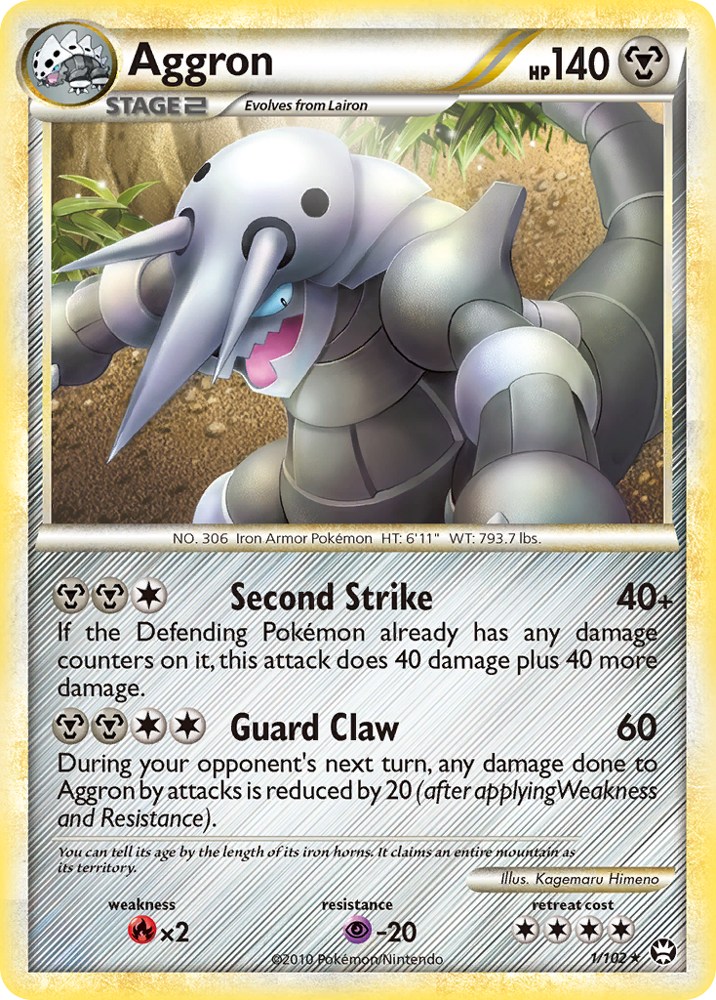

In [ ]:
images[8]

Here, we will embed 100 images and texts in one batch. No worries, Colab's GPU can handle it very well. In practice, to handle larger batch sizes, you may want to split them into smaller batches to avoid running out of memory (OOM).

Let's plot the confusion matrix and see how the relationships look between each modality.

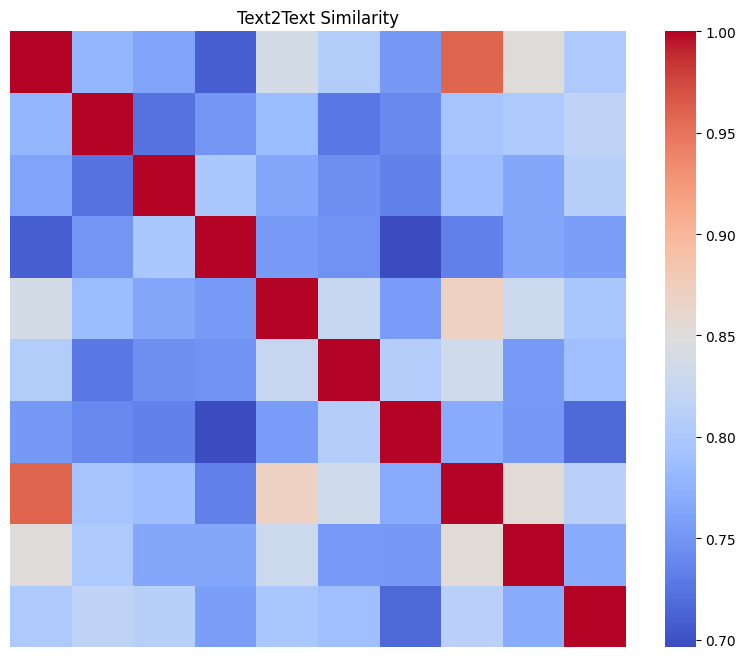

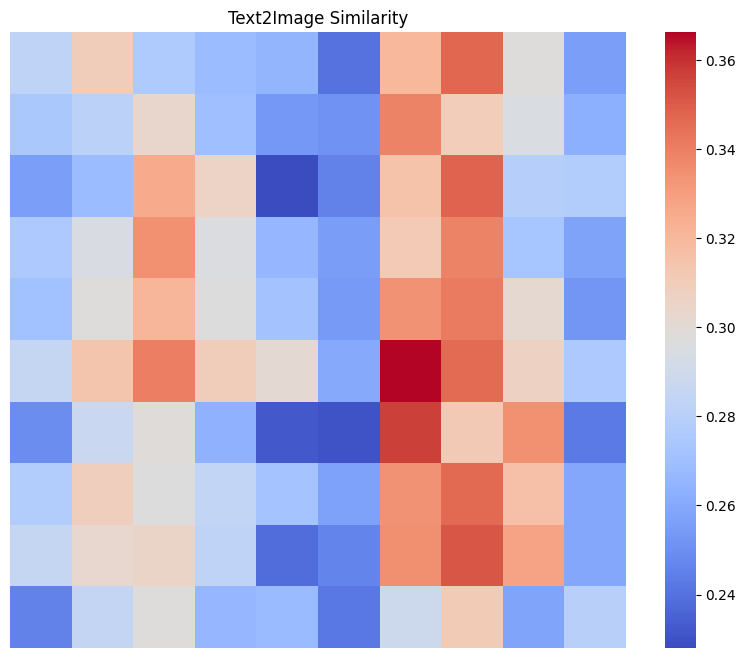

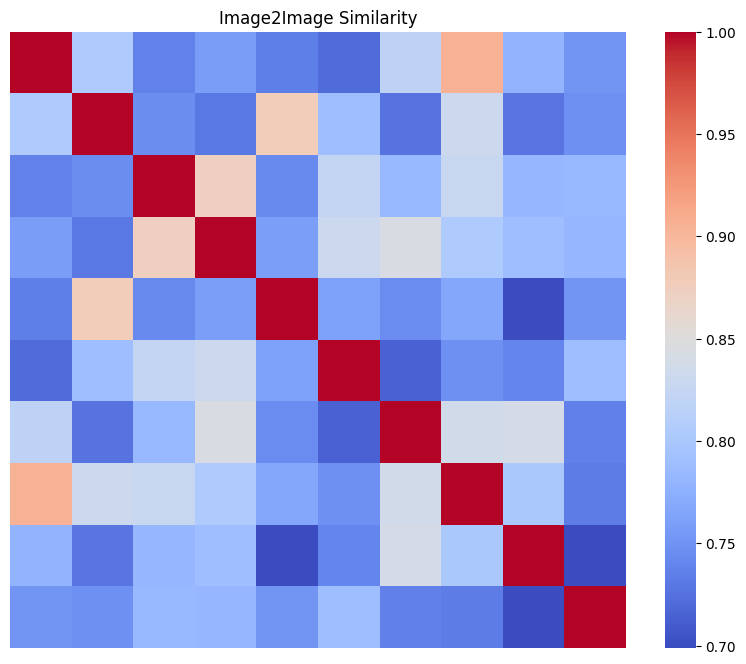

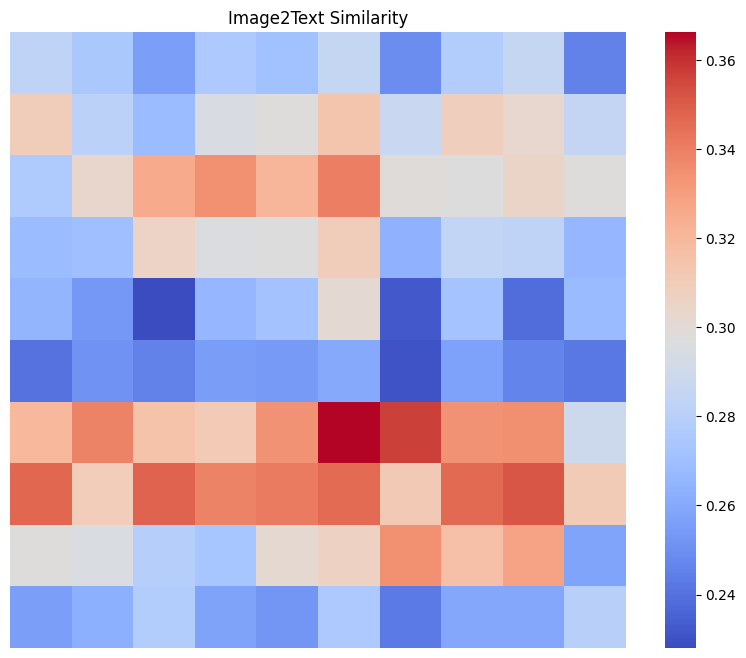

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate cosine similarities
text2text_sim = cosine_similarity(text_embeddings)
text2image_sim = cosine_similarity(text_embeddings, image_embeddings)
image2image_sim = cosine_similarity(image_embeddings)
image2text_sim = cosine_similarity(image_embeddings, text_embeddings)

# Function to plot half diagonal confusion matrices
def plot_half_confusion_matrix(similarity_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(similarity_matrix, annot=False, cmap='coolwarm', cbar=True, square=True)
    plt.title(title)
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks([])
    plt.yticks([])
    plt.show()

# Plot confusion matrices
plot_half_confusion_matrix(text2text_sim, 'Text2Text Similarity')
plot_half_confusion_matrix(text2image_sim, 'Text2Image Similarity')
plot_half_confusion_matrix(image2image_sim, 'Image2Image Similarity')
plot_half_confusion_matrix(image2text_sim, 'Image2Text Similarity')


Apparently, image-to-image and text-to-text retrieval are easy tasks, with the highest relevance concentrating on the diagonal of the matrix. Image-to-text and text-to-image retrievals are not as easy, but at least some patterns on the diagonal suggest it is possible to capture such relationships with Jina CLIP. If you look at the `text` field of the card, you can understand why this is the case. The `text` descriptions mainly focus on the functionality of the card, not its visual description.

Let's find if we have pokemon close to "cute but evil" in our 100 pokemon cards.

In [ ]:
query_embedding = model.encode_text('cute but evil')

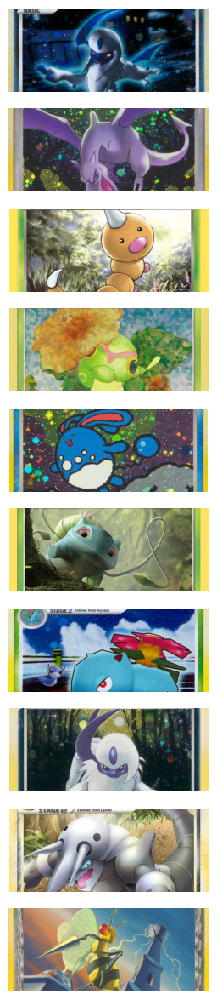

In [ ]:
# Calculate cosine similarities
similarities = cosine_similarity([query_embedding], image_embeddings)[0]

# Get top-5 highest cosine similarities and their indices
top_5_indices = similarities.argsort()[-5:][::-1]
top_5_similarities = similarities[top_5_indices]

# Plot the images with their similarity scores
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.imshow(cropped_images[i])
    plt.axis('off')
plt.show()

In [ ]:
names

['Absol G',
 'Aerodactyl',
 'Weedle',
 'Caterpie',
 'Azumarill',
 'Bulbasaur',
 'Venusaur',
 'Absol',
 'Aggron',
 'Beedrill δ']